In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

/home/codekage/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/codekage/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/codekage/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/codekage/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.

In [3]:
df = pd.read_csv("./train.csv")
labels = df.pop("label").values
df = df.values.reshape(-1,28,28)

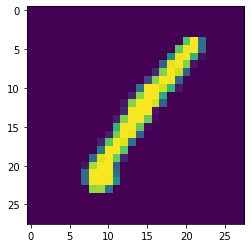

In [4]:
plt.imshow(df[0])

In [5]:
inputs = Input(shape=(28,28,1))

conv1 = Conv2D(32,6,activation="relu",input_shape=(28,28,1),padding="same")(inputs)
conv2 = Conv2D(64,4,activation="relu",padding="same")(conv1)
pool1 = MaxPool2D()(conv2)
conv3 = Conv2D(64,3,activation="relu")(pool1)
pool2 = MaxPool2D()(conv3)
flat = Flatten()(pool2)
dense = Dense(512,activation="relu")(flat)
dense = Dense(128,activation="relu")(dense)
dense = Dense(32,activation="relu")(dense)
encoder = Dense(2)(dense)
softmax = Dense(10,activation="softmax")(encoder)

model = Model(inputs,encoder)

model_ = Model(inputs,softmax)


In [6]:
model_.compile(optimizer="adam",loss="categorical_crossentropy",metrics=['accuracy'])

In [7]:
model_.fit(df.reshape(-1,28,28,1),pd.get_dummies(labels).values,epochs=15,batch_size=1000)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 42000 samples
Epoch 1/15
42000/42000 [==============================] - 7s 167us/sample - loss: 3.4727 - accuracy: 0.2657
Epoch 2/15
42000/42000 [==============================] - 4s 107us/sample - loss: 1.1075 - accuracy: 0.5092
Epoch 3/15
42000/42000 [==============================] - 4s 106us/sample - loss: 0.8563 - accuracy: 0.5780
Epoch 4/15
42000/42000 [==============================] - 4s 106us/sample - loss: 0.6888 - accuracy: 0.6209
Epoch 5/15
42000/42000 [==============================] - 4s 107us/sample - loss: 0.5184 - accuracy: 0.6925
Epoch 6/15
42000/42000 [==============================] - 4s 107us/sample - loss: 0.3970 - accuracy: 0.8270
Epoch 7/15
42000/42000 [==============================] - 4s 107us/sample - loss: 0.2498 - accuracy: 0.9205
Epoch 8/15
42000/42000 [==============================] - 5s 108us/sample - loss: 0.1920 - accuracy: 0.9547
Epoch 9/15
42000/42

In [8]:
compressed = model.predict(df.reshape(-1,28,28,1))

In [9]:
compressed = pd.DataFrame(np.concatenate((compressed,labels.reshape(-1,1)),axis=1),columns=['x','y','target'])

In [10]:
import plotly.express as ex

In [11]:
ex.scatter(data_frame=compressed,x='x',y='y',color='target')

In [12]:
inputs = Input(shape=(28,28,1))

conv1 = Conv2D(32,6,activation="relu",input_shape=(28,28,1),padding="same")(inputs)
conv2 = Conv2D(64,4,activation="relu",padding="same")(conv1)
pool1 = MaxPool2D()(conv2)
conv3 = Conv2D(64,3,activation="relu")(pool1)
pool2 = MaxPool2D()(conv3)
flat = Flatten()(pool2)
dense = Dense(512,activation="relu")(flat)
dense = Dense(128,activation="relu")(dense)
dense = Dense(32,activation="relu")(dense)
encoder = Dense(3)(dense)
softmax = Dense(10,activation="softmax")(encoder)

model = Model(inputs,encoder)

model_ = Model(inputs,softmax)


In [13]:
model_.compile(optimizer="adam",loss="categorical_crossentropy",metrics=['accuracy'])

In [14]:
model_.fit(df.reshape(-1,28,28,1),pd.get_dummies(labels).values,epochs=15,batch_size=1000)

Train on 42000 samples
Epoch 1/15
42000/42000 [==============================] - 5s 111us/sample - loss: 6.0008 - accuracy: 0.2020
Epoch 2/15
42000/42000 [==============================] - 4s 106us/sample - loss: 0.9314 - accuracy: 0.6576
Epoch 3/15
42000/42000 [==============================] - 4s 107us/sample - loss: 0.5122 - accuracy: 0.7972
Epoch 4/15
42000/42000 [==============================] - 5s 107us/sample - loss: 0.3552 - accuracy: 0.8703
Epoch 5/15
42000/42000 [==============================] - 4s 107us/sample - loss: 0.2839 - accuracy: 0.8814
Epoch 6/15
42000/42000 [==============================] - 5s 108us/sample - loss: 0.2430 - accuracy: 0.8881
Epoch 7/15
42000/42000 [==============================] - 5s 115us/sample - loss: 0.2124 - accuracy: 0.8909
Epoch 8/15
42000/42000 [==============================] - 5s 108us/sample - loss: 0.1822 - accuracy: 0.8939
Epoch 9/15
42000/42000 [==============================] - 5s 107us/sample - loss: 0.1204 - accuracy: 0.9566
Epoch

In [15]:
compressed = model.predict(df.reshape(-1,28,28,1))
compressed = pd.DataFrame(np.concatenate((compressed,labels.reshape(-1,1)),axis=1),columns=['x','y','z','target'])

In [16]:
ex.scatter_3d(data_frame=compressed,x='x',y='y',z='z',color='target')